# Visualizing PubMed article GitHub repository software information entropy

The content below seeks to better understand how software information entropy manifests in a dataset of ~10,000 PubMed article GitHub repositories.

PubMed GitHub repositories are extracted using the PubMed API to query for GitHub links within article abstracts.
GitHub data about these repositories is gathered using the GitHub API.
The code to perform data extractions may be found under the directory: [gather-pubmed-repos](https://github.com/software-gardening/almanack/tree/main/src/book/seed-bank/pubmed-github-repositories/gather-pubmed-repos/) .

Software entropy measurements are gathered using the notebook: [software-information-entropy.ipynb](https://github.com/software-gardening/almanack/tree/main/src/book/seed-bank/pubmed-github-repositories/software-information-entropy.ipynb) .

We derive software information entropy using methods inspired from _Predicting faults using the complexity of code changes_{cite:p}`hassan_predicting_2009`.
Software information entropy within the context of this notebook is normalized for all files within a repository using the first and latest commits.

Project durations highlighted below is the number of days between the first and latest commit date.

## Data Extraction

The following section extracts data which includes software entropy and GitHub-derived data.
We merge the data to form a table which includes PubMed, GitHub, and Almanack software entropy information on the repositories.

In [19]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.io as pio

# set plotly default theme
pio.templates.default = "plotly_white"

# read example data which includes pubmed github links detected from article abstracts
df = pd.merge(
    left=pd.read_parquet("repository_analysis_results"),
    right=pd.read_parquet(
        "gather-pubmed-repos/pubmed_github_links_with_github_data.parquet"
    ),
    left_on="Repository URL",
    right_on="github_link",
)
df

,Repository URL,Normalized Total Entropy,Date of First Commit,Date of Last Commit,Time of Existence (days),PMID,article_date,title,authors,github_link,...,GitHub Detected Languages,Date Created,Date Most Recent Commit,Duration Created to Most Recent Commit,Duration Created to Now,Duration Most Recent Commit to Now,Repository Size (KB),GitHub Repo Archived,total lines of GitHub detected code,Primary language
0,https://github.com/BUStools/BUSZ-format,0.000000,2022-11-08,2022-11-18,10.0,37129540,None,BUSZ: compressed BUS files.,"Einarsson, Melsted",https://github.com/BUStools/BUSZ-format,...,"{'AGS Script': None, 'AMPL': None, 'ANTLR': No...",2022-11-08 14:44:25+00:00,2022-11-18 15:22:39+00:00,,,,5,False,0,None
1,https://github.com/pmelsted/BUSZ_paper,0.178897,2023-03-27,2023-03-28,1.0,37129540,None,BUSZ: compressed BUS files.,"Einarsson, Melsted",https://github.com/pmelsted/BUSZ_paper,...,"{'AGS Script': None, 'AMPL': None, 'ANTLR': No...",2023-03-27 13:37:38+00:00,2023-03-28 21:04:19+00:00,,,,78,False,13927,Python
2,https://github.com/WormBase/scdefg,0.153966,2021-01-29,2022-02-02,368.0,35814290,2022-03-28,WormBase single-cell tools.,"da Veiga Beltrame, Arnaboldi, Sternberg",https://github.com/WormBase/scdefg,...,"{'AGS Script': None, 'AMPL': None, 'ANTLR': No...",2021-02-24 03:39:24+00:00,2022-09-04 00:33:47+00:00,,,,136,False,37039,Python
3,https://github.com/ekg/guix-genomics,0.176469,2020-01-06,2024-01-22,1476.0,36448683,None,Unbiased pangenome graphs.,"Garrison, Guarracino",https://github.com/ekg/guix-genomics,...,"{'AGS Script': None, 'AMPL': None, 'ANTLR': No...",2020-01-06 21:03:53+00:00,2024-01-22 17:24:15+00:00,,,,261,False,68889,Scheme
4,https://github.com/ekg/seqwish,0.027122,2018-06-11,2023-12-09,2007.0,36448683,None,Unbiased pangenome graphs.,"Garrison, Guarracino",https://github.com/ekg/seqwish,...,"{'AGS Script': None, 'AMPL': None, 'ANTLR': No...",2018-06-11 15:31:26+00:00,2024-04-07 20:25:49+00:00,,,,883,False,179753,C++
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11153,https://github.com/maxplanck-ie/parkour,0.000449,2016-05-23,2022-08-24,2284.0,30239601,None,Parkour LIMS: high-quality sample preparation ...,"Anatskiy, Ryan, Grüning, Arrigoni, Manke, Bönisch",https://github.com/maxplanck-ie/parkour,...,"{'AGS Script': None, 'AMPL': None, 'ANTLR': No...",2016-05-23 09:18:45+00:00,2022-08-24 16:08:54+00:00,,,,69014,True,121557916,JavaScript
11154,https://github.com/linsalrob/partie,0.000257,2016-09-19,2022-10-23,2224.0,28369246,None,PARTIE: a partition engine to separate metagen...,"Torres, Edwards, McNair",https://github.com/linsalrob/partie,...,"{'AGS Script': None, 'AMPL': None, 'ANTLR': No...",2016-09-19 17:45:30+00:00,2023-02-25 21:59:03+00:00,,,,257411,False,32264,Perl
11155,https://github.com/louzounlab/CountingIsAlmost...,0.011558,2022-06-15,2022-11-04,141.0,36741395,2023-01-20,Counting is almost all you need.,"Akerman, Isakov, Levi, Psevkin, Louzoun",https://github.com/louzounlab/CountingIsAlmost...,...,"{'AGS Script': None, 'AMPL': None, 'ANTLR': No...",2022-08-08 10:09:39+00:00,2022-11-04 15:00:17+00:00,,,,867622,False,118683,Python
11156,https://github.com/sysbio-polito/NWN_CElegans_...,0.002924,2021-02-12,2021-10-06,235.0,34765090,2021-10-09,Nets-within-nets for modeling emergent pattern...,"Bardini, Benso, Politano, Di Carlo",https://github.com/sysbio-polito/NWN_CElegans_...,...,"{'AGS Script': None, 'AMPL': None, 'ANTLR': No...",2021-02-12 12:41:36+00:00,2021-10-06 07:47:40+00:00,,,,2755061,False,65375,Java


## What languages are used within PubMed article repositories?

The following section observes the top 10 languages which are used in repositories from the dataset.
Primary language is determined as the language which has the most lines of code within a repository.

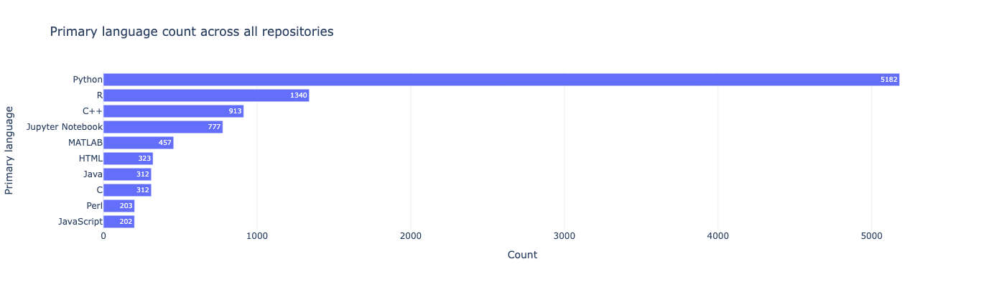

In [16]:
language_grouped_data = (
    df.groupby(["Primary language"]).size().reset_index(name="Count")
)

# Create a horizontal bar chart
fig_languages = px.bar(
    language_grouped_data.sort_values(by="Count")[-10:],
    y="Primary language",
    x="Count",
    text="Count",
    orientation="h",
    width=700,
    height=400,
    title="Primary language count across all repositories",
)

fig_languages.show()

## How is software entropy different across primary languages?

The following section explores how software entropy manifests differently across different primary languages for repositories.

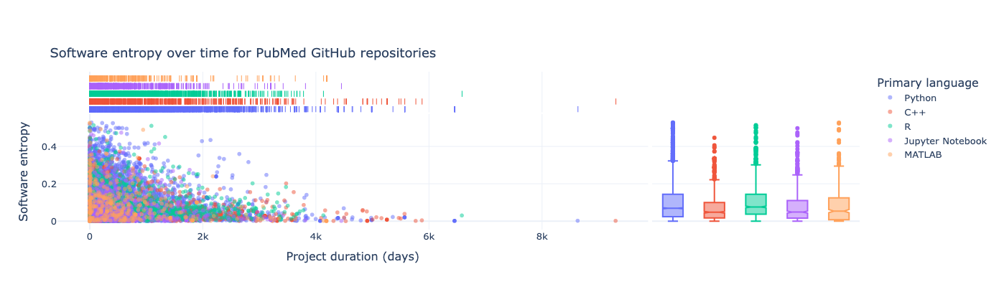

In [3]:
fig = px.scatter(
    df[
        df["Primary language"].isin(
            language_grouped_data.sort_values(by="Count")[-5:]["Primary language"]
        )
    ],
    x="Time of Existence (days)",
    y="Normalized Total Entropy",
    hover_data=["Repository URL"],
    width=700,
    height=400,
    title="Software entropy over time for PubMed GitHub repositories",
    marginal_x="rug",
    marginal_y="box",
    opacity=0.5,
    color="Primary language",
)

fig.update_layout(
    font=dict(size=13),
    title={"yref": "container", "y": 0.8, "yanchor": "bottom"},
    xaxis_title="Project duration (days)",
    yaxis_title="Software entropy",
)
fig.write_image("images/software-information-entropy-top-5-langs.png")
fig.show()

## What is the relationship between GitHub Stars and Forks for repositories?

We next explore how GitHub Stars and Forks are related within the repositories.

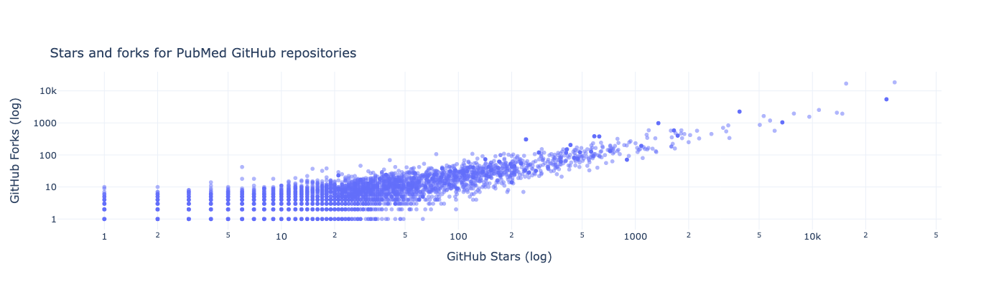

In [10]:
fig = px.scatter(
    df,
    x="GitHub Stars",
    y="GitHub Forks",
    hover_data=["Repository URL"],
    width=700,
    height=400,
    title="Stars and forks for PubMed GitHub repositories",
    opacity=0.5,
    log_y=True,
    log_x=True,
)

fig.update_layout(
    font=dict(size=13),
    title={"yref": "container", "y": 0.8, "yanchor": "bottom"},
    xaxis_title="GitHub Stars",
    yaxis_title="GitHub Forks",
)
fig.write_image("images/pubmed-stars-and-forks.png")
fig.show()

## How do GitHub Stars, software entropy, and time relate?

The next section explores how GitHub Stars, software entropy, and time relate to one another.

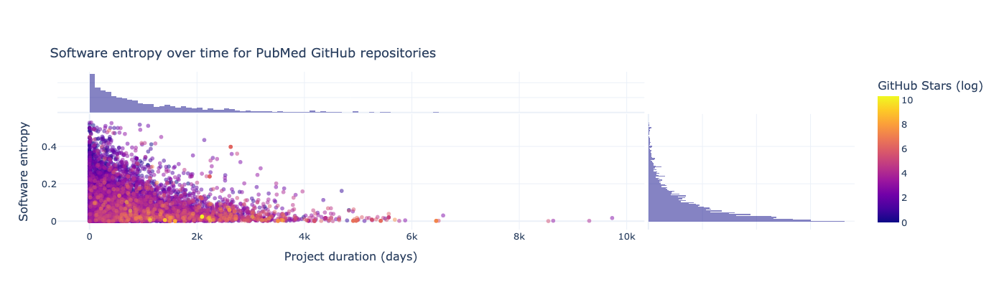

In [11]:
df["GitHub Stars (log)"] = np.log(
    df["GitHub Stars"].apply(
        # move 0's to None to avoid divide by 0
        lambda x: x if x > 0 else None
    )
)

fig = px.scatter(
    df.dropna(subset="GitHub Stars (log)").sort_values(by="GitHub Stars (log)"),
    x="Time of Existence (days)",
    y="Normalized Total Entropy",
    hover_data=["Repository URL"],
    width=700,
    height=400,
    title="Software entropy over time for PubMed GitHub repositories",
    marginal_x="histogram",
    marginal_y="histogram",
    opacity=0.5,
    color="GitHub Stars (log)",
)

fig.update_layout(
    font=dict(size=13),
    title={"yref": "container", "y": 0.8, "yanchor": "bottom"},
    xaxis_title="Project duration (days)",
    yaxis_title="Software entropy",
)
fig.write_image("images/software-information-entropy-gh-stars.png")
fig.show()

## How do GitHub Forks, software entropy, and time relate?

The next section explores how GitHub Forks, software entropy, and time relate to one another.

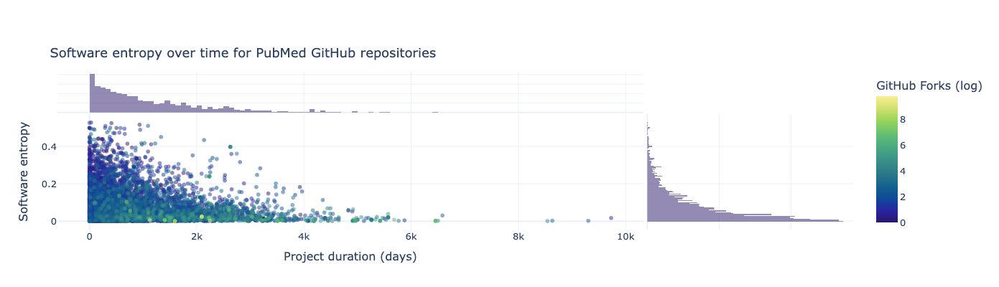

In [12]:
df["GitHub Forks (log)"] = np.log(
    df["GitHub Forks"].apply(
        # move 0's to None to avoid divide by 0
        lambda x: x if x > 0 else None
    )
)

fig = px.scatter(
    df.dropna(subset="GitHub Forks (log)").sort_values(by="GitHub Forks (log)"),
    x="Time of Existence (days)",
    y="Normalized Total Entropy",
    hover_data=["Repository URL"],
    width=700,
    height=400,
    title="Software entropy over time for PubMed GitHub repositories",
    marginal_x="histogram",
    marginal_y="histogram",
    opacity=0.5,
    color="GitHub Forks (log)",
    color_continuous_scale=px.colors.sequential.haline,
)

fig.update_layout(
    font=dict(size=13),
    title={"yref": "container", "y": 0.8, "yanchor": "bottom"},
    xaxis_title="Project duration (days)",
    yaxis_title="Software entropy",
)
fig.write_image("images/software-information-entropy-forks.png")
fig.show()

## What is the relationship between GitHub Stars and Open Issues for the repositories?

Below we explore how GitHub Stars and Open Issues are related for the repositories.

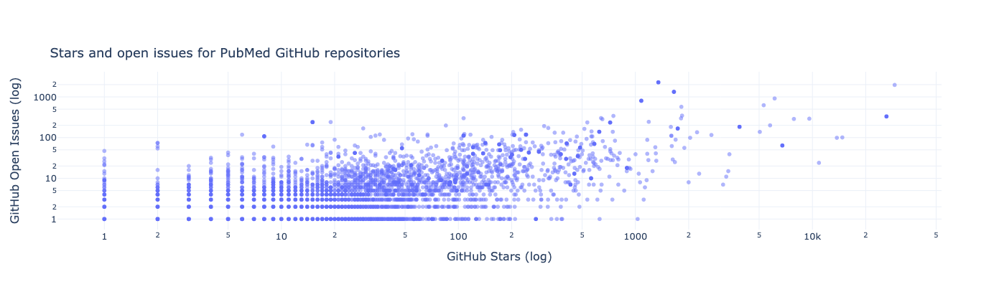

In [13]:
df["GitHub Open Issues (log)"] = np.log(
    df["GitHub Open Issues"].apply(
        # move 0's to None to avoid divide by 0
        lambda x: x if x > 0 else None
    )
)
fig = px.scatter(
    df,
    x="GitHub Stars",
    y="GitHub Open Issues",
    hover_data=["Repository URL"],
    width=700,
    height=400,
    title="Stars and open issues for PubMed GitHub repositories",
    opacity=0.5,
    log_y=True,
    log_x=True,
)

fig.update_layout(
    font=dict(size=13),
    title={"yref": "container", "y": 0.8, "yanchor": "bottom"},
    xaxis_title="GitHub Stars (log)",
    yaxis_title="GitHub Open Issues (log)",
)
fig.write_image("images/pubmed-stars-and-open-issues.png")
fig.show()

## How do software entropy, time, and GitHub issues relate to one another?

The next section visualizes how software entropy, time, and GitHub issues relate to one another.

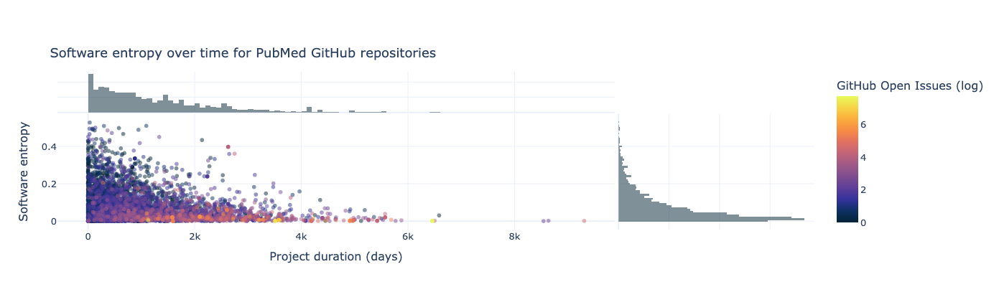

In [14]:
df["GitHub Open Issues (log)"] = np.log(
    df["GitHub Open Issues"].apply(
        # move 0's to None to avoid divide by 0
        lambda x: x if x > 0 else None
    )
)

fig = px.scatter(
    df.dropna(subset="GitHub Open Issues (log)").sort_values(
        by="GitHub Open Issues (log)"
    ),
    x="Time of Existence (days)",
    y="Normalized Total Entropy",
    hover_data=["Repository URL"],
    width=700,
    height=400,
    title="Software entropy over time for PubMed GitHub repositories",
    marginal_x="histogram",
    marginal_y="histogram",
    opacity=0.5,
    color="GitHub Open Issues (log)",
    color_continuous_scale=px.colors.sequential.thermal,
)

fig.update_layout(
    font=dict(size=13),
    title={"yref": "container", "y": 0.8, "yanchor": "bottom"},
    xaxis_title="Project duration (days)",
    yaxis_title="Software entropy",
)
fig.write_image("images/software-information-entropy-open-issues.png")
fig.show()

```{bibliography}
---
style: unsrt
filter: docname in docnames
labelprefix: SB
---
```